<a href="https://colab.research.google.com/github/poojan007/ICT606-Tutorials/blob/main/ICT606_Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BERTopic on Twitter Climate Change Dataset

This notebook demonstrates the step-by-step process of performing BERTopic for topic modeling. The main tasks include data preprocessing, topic modeling, and visualization of the results.

Installing BERTopic package

In [36]:
%%capture
!pip install bertopic

## Data preparation

First, we need to import the necessary libraries and load the dataset into a pandas DataFrame. Then, we will inspect and clean the data, including converting text to lowercase.

In [54]:
import pandas as pd
import numpy as np
from bertopic import BERTopic

from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords
import nltk
import re

import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns

# Download necessary NLTK data files
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

# Load your dataset
df = pd.read_csv('twitter_sentiment_data.csv')
df.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,sentiment,message,tweetid
0,-1,@tiniebeany climate change is an interesting h...,792927353886371840
1,1,RT @NatGeoChannel: Watch #BeforeTheFlood right...,793124211518832641
2,1,Fabulous! Leonardo #DiCaprio's film on #climat...,793124402388832256
3,1,RT @Mick_Fanning: Just watched this amazing do...,793124635873275904
4,2,"RT @cnalive: Pranita Biswasi, a Lutheran from ...",793125156185137153


## Exploratory Data Analysis (EDA)

General Statistics

The dataset has 43943 observations and 3 variables.

In [55]:
# General Statistics
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43943 entries, 0 to 43942
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  43943 non-null  int64 
 1   message    43943 non-null  object
 2   tweetid    43943 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.0+ MB
None
          sentiment       tweetid
count  43943.000000  4.394300e+04
mean       0.853924  8.367966e+17
std        0.853543  8.568506e+16
min       -1.000000  5.926334e+17
25%        0.000000  7.970376e+17
50%        1.000000  8.402301e+17
75%        1.000000  9.020003e+17
max        2.000000  9.667024e+17


Word cloud to check the word occurence

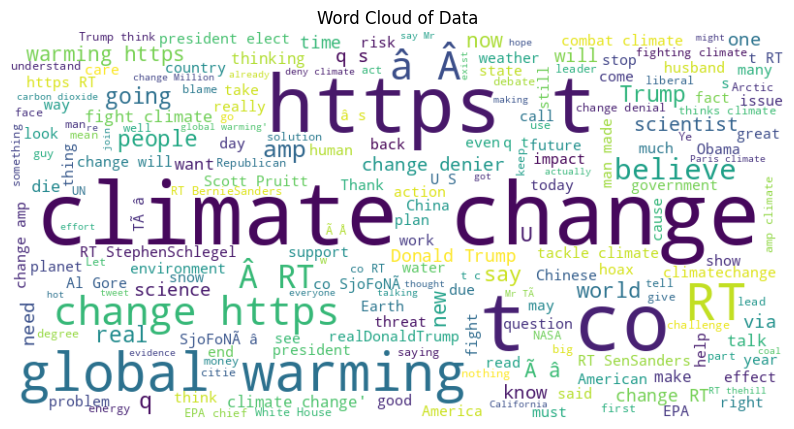

In [56]:
# Word Cloud
text = ' '.join(df['message'].tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Data')
plt.show()

## Data preprocessing

In this step, we preprocess the text by removing URLs, mentions, hashtags, special characters, and extra spaces. We also perform tokenization, and apply lemmatization.

In [57]:
# Identify inconsistencies
# It returns a boolean Series indicating whether each row is a duplicate or not.
# By passing this boolean Series as a filter to the DataFrame `df`, only the duplicate rows are selected and stored in the variable `duplicate_rows`.
duplicate_rows = df[df.duplicated()]
duplicate_rows

,sentiment,message,tweetid


In [58]:
# Identify missing values
# The code is calculating the number of missing values in each column of the DataFrame `df`.
# It uses the `isna()` method to check for missing values and the `sum()` method to calculate the total number
# of missing values in each column. The result is stored in the variable `missing_values`.
missing_values = df.isna().sum()
missing_values

sentiment    0
message      0
tweetid      0
dtype: int64

In [78]:
stemmer = PorterStemmer()

def stem_text(text):
    tokens = word_tokenize(text)
    stemmed_tokens = [stemmer.stem(word) for word in tokens]
    return ' '.join(stemmed_tokens)

# Define stop words
stop_words = set(stopwords.words('english'))

# Function to remove stop words
def remove_stopwords(text):
    tokens = word_tokenize(text)
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]
    return ' '.join(filtered_tokens)

# Preprocess the text
def preprocess_text(text):
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'@\w+', '', text)  # Remove mentions
    text = re.sub(r'#\w+', '', text)  # Remove hashtags
    text = re.sub(r'[^A-Za-z\s]', '', text)  # Remove special characters
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return text

df['cleaned_text'] = df['message'].apply(preprocess_text)

# Lemmatization
lemmatizer = WordNetLemmatizer()

def lemmatize_text(text):
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(tokens)

# Lemmatize
df['cleaned_text'] = df['cleaned_text'].apply(lemmatize_text)

# # Remove stop words
# df['cleaned_text'] = df['cleaned_text'].apply(remove_stopwords)

# Stemming
#df['cleaned_text'] = df['cleaned_text'].apply(stem_text)

df.head()

,sentiment,message,tweetid,cleaned_text
0,-1,@tiniebeany climate change is an interesting h...,792927353886371840,climate change is an interesting hustle a it w...
1,1,RT @NatGeoChannel: Watch #BeforeTheFlood right...,793124211518832641,RT Watch right here a travel the world to tack...
2,1,Fabulous! Leonardo #DiCaprio's film on #climat...,793124402388832256,Fabulous Leonardo s film on change is brillian...
3,1,RT @Mick_Fanning: Just watched this amazing do...,793124635873275904,RT Just watched this amazing documentary by le...
4,2,"RT @cnalive: Pranita Biswasi, a Lutheran from ...",793125156185137153,RT Pranita Biswasi a Lutheran from Odisha give...


## Model Training

In [79]:
topic_model = BERTopic(language = "english")
topics, probabilities = topic_model.fit_transform(df['cleaned_text'])

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



In [80]:
# check the topic length
len(topics), len(set(topics))

(43943, 684)

In [75]:
# Check the topic frequencies for all the topics
topic_model.get_topic_freq()

,Topic,Count
5,-1,17416
34,0,458
406,1,397
23,2,354
9,3,292
...,...,...
343,635,10
408,636,10
68,637,10
309,638,10


## Visualisations

In [63]:
# Visualize topics
topic_model.visualize_topics()

In [64]:
# Visualise the topic hierarchies
topic_model.visualize_hierarchy(top_n_topics=50)

In [65]:
# Visualise the top 5 topics
topic_model.visualize_barchart(top_n_topics=5)

In [66]:
# Visualise the topic similarity matrix
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [67]:
# Visualise the topic decline score
topic_model.visualize_term_rank()

## Model Evaluation



In [81]:
# import library from gensim
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel

# Preprocess documents
cleaned_docs = topic_model._preprocess_text(df["cleaned_text"])

# Extract vectorizer from BERTopic
vectorizer = topic_model.vectorizer_model

# Extract features for Topic Coherence evaluation
analyzer = vectorizer.build_analyzer()
tokens = [analyzer(doc) for doc in cleaned_docs]
dictionary = corpora.Dictionary(tokens)
corpus = [dictionary.doc2bow(token) for token in tokens]
topics = topic_model.get_topics()
topics.pop(-1, None)
topic_words = [
[word for word, _ in topic_model.get_topic(topic) if word != ""] for topic in topics
]
topic_words = [[words for words, _ in topic_model.get_topic(topic)]
        for topic in range(len(set(topics))-1)][:10]

# Evaluate
coherence_model = CoherenceModel(topics=topic_words,
                          texts=tokens,
                          corpus=corpus,
                          dictionary=dictionary,
                          coherence='c_v')
coherence = coherence_model.get_coherence()

In [82]:
print(coherence)

0.5407642551243179


In [83]:
coherence_per_topic = coherence_model.get_coherence_per_topic()
coherence_per_topic[:10]

[0.3562964294858958,
 0.3729119673825604,
 0.46566799575082063,
 0.2932467438846594,
 0.2611515140462943,
 0.9824186006104512,
 0.3965851622187027,
 0.5662276667027923,
 0.7307178705505514,
 0.9824186006104512]